---
* **Universidad:** UOC (Universitat Oberta de Catalunya)
* **Titulación:** Master Ciencia de Datos/TFM
* **Título:** Segmentación de imágenes utilizando Redes Generativas Antagónicas
* **Actividad**: Segmentación partes cuerpo personas con armas cortas utilizando modelos pre entrenados
* **Autor:** Miguel Ponce
* **Correo:** miguelalejoponce@uoc.edu
* **Fecha:** "Enero, 04 de 2023"
* **Salida**: ipynb
---
## Contexto: Modelo detección de personas armadas

* **Contexto:**
Se desea crear un modelo que permita segmentar ha personas con armas cortas.

* **Problema:** 
El objetivo de la proyecto es permitir que mediante las técnicas de mejoras en la segmentación de objetos en imágenes se puedan proponer nuevos sistemas de vigilancia y alerta temprana contra sospechosos de intento de asesinato y porte ilegal de armas. Es necesrio crear un modelo de segmentación de personas con armadas con armas cortas, basados en un conjunto de datos pre-entrenado mediante el uso de redes GAN y arquitecturtas pensadas para la segmentación de objetos.

* **Solucion :** 
Se construye una red antagónica generativa condicional (cGAN) basada en el trabajo de pix2pix una red que realiza un proceso de mapaeo de imágenes de entrada hacia imágenes de salida. Este proceoso se conoce como la traducción de imagen a imagen con GANs, [trabajo](https://arxiv.org/abs/1611.07004) realizado por Isola et al. en el 2017. Se puede utilizar está aruqitecutra de red multi-proposito ya que se puede aplicar en varias tareas, Por ejmeplo:  síntesis de fotos a partir de mapas, generación de fotos con color a partir de imágenes en blanco y negro, conversión de fotos de Google Maps en imágenes aéreas e incluso la transformación de bocetos en fotos.

* **Entorno:** con GPU.
  
---
## Origen del la fuente de datos


@misc{ data-set-person-armed-segmented_dataset,
    title = { data-set-person-armed-segmented Dataset },
    type = { Open Source Dataset },
    author = { Miguel Alejandro Ponce Proaño },
    howpublished = { \url{ https://universe.roboflow.com/miguel-alejandro-ponce-proano/data-set-person-armed-segmented } },
    url = { https://universe.roboflow.com/miguel-alejandro-ponce-proano/data-set-person-armed-segmented },
    journal = { Roboflow Universe },
    publisher = { Roboflow },
    year = { 2023 },
    month = { jan },
    note = { visited on 2023-01-08 },
} 
--- 
## Referencias:
Este notebook se basa en el desarrollo de trabajos realizados previamente por:
* [Zakaria Mejdoul](https://github.com/zakariamejdoul/ground-truth-gan-segmentation/blob/main/ground-truth-gan-segmentation.ipynb)
* [TensorFLow](https://www.tensorflow.org/tutorials/generative/pix2pix)

* [Jason Brownlee](https://machinelearningmastery.com/how-to-develop-a-pix2pix-gan-for-image-to-image-translation/)

#Carateristicas
Múltiples imagenes incluyen con y sin arma 512x512 pixeles


## Licencia
MIT License

Copyright (c) 2018 Continual AI

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.


# Características de la red pix2pix: Red GAN Segmentación de personas con armas

A continuación se desarrollará una res que generará imágenes en donde se realizó la segmentación de las partes del cuerpo de una persona armada. Utiliza una base de datos que contiene a las personas y las armas segmentadas(color rojo), trabajo desarrollado por Miguel Ponce, estudiante de la Universidad de UOC, en el [Máster de Ciencia de Datos](https://estudios.uoc.edu/es/masters-universitarios/data-science/presentacion). 

La arquitectura de esta red está formada por:
* **Genrador**: una arquitectura basada en [U-Net](https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/).
* **Discriminador**: representado por un clasificador PatchGAN convolucional propuesto en el artículo de pix2pix. Se debe tomar en cuenta que cada época puede demorar alrededor varios minutos o segundos dependiendo de la cantidad de GPU aprovisionada.

Sen realizara el entrenamiento de la red cGAN durante 40000 épocas en el conjunto de datos.


## Descargamos el conjunto de datos

El conjunto de datos es una base de 800 imágenes, en donde se identificaran varias personas que están armas y otro grupo de personas sin armas. Esta base de datos sintetiza los procesos de extracción y detección de objetos para la detección de armas. La creación de los conjuntos de datos fue mediante el uso de la herramienta Roboflow; herramienta que permite simplificar el proceso de generación y creación de conjuntos de datos.

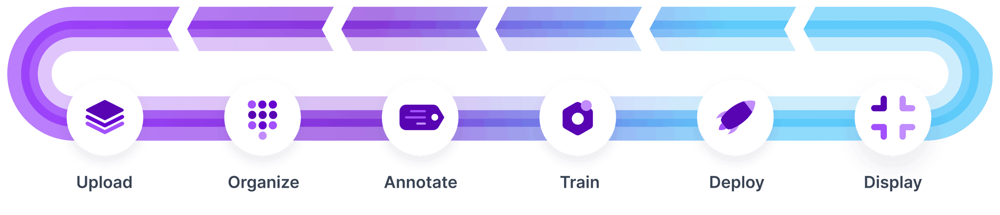

In [ ]:
!pip install roboflow

In [ ]:
from roboflow import Roboflow
VERSION = 4
rf = Roboflow(api_key="3rOW8xY5g1wv0JEQF2Vl")
project = rf.workspace("miguel-alejandro-ponce-proano").project("data-set-person-armed-segmented")
dataset = project.version(VERSION).download("folder")

loading Roboflow workspace...
loading Roboflow project...

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
dataset_path = "./{fpath}-{fversion}".format(fpath="data-set-person-armed-segmented",fversion=VERSION)
dataset_path

'./data-set-person-armed-segmented-4'

In [ ]:
#!rm -rf data-set-person-armed-segmented.zip
#!wget https://app.roboflow.com/ds/qURGLecLna?key=JyU8omewus

SYSTEM_WGETRC = c:/progra~1/wget/etc/wgetrc
syswgetrc = C:\Program Files (x86)\GnuWin32/etc/wgetrc
--2023-01-08 21:28:22--  https://app.roboflow.com/ds/qURGLecLna?key=JyU8omewus
Resolving app.roboflow.com... 151.101.65.195, 151.101.1.195
Connecting to app.roboflow.com|151.101.65.195|:443... connected.
OpenSSL: error:1407742E:SSL routines:SSL23_GET_SERVER_HELLO:tlsv1 alert protocol version
Unable to establish SSL connection.


In [ ]:
#!rm -rf data-set-person-armed-segmented
#!unzip ./data-set-person-armed-segmented.zip -d ./data-set-person-armed-segmented

Archive:  ./data-set-person-armed-segmented.zip

  End-of-central-directory signature not found.  Either this file is not
  a zipfile, or it constitutes one disk of a multi-part archive.  In the
  latter case the central directory and zipfile comment will be found on
  the last disk(s) of this archive.
unzip:  cannot find zipfile directory in ./data-set-person-armed-segmented.zip,
        and cannot find ./data-set-person-armed-segmented.zip.zip, period.


## Librerías

In [ ]:
import tensorflow as tf
import os
import pathlib
import time
import datetime
from matplotlib import pyplot as plt
from IPython import display
import glob
from pathlib import Path
from PIL import Image
import random
import matplotlib.image as mpimg
import numpy as np
import cv2

## Constantes

In [ ]:
PATH = dataset_path
# The facade training set consist of 400 images
BUFFER_SIZE = 400
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 512x512 in size
IMG_WIDTH = 512
IMG_HEIGHT = 512
SEMILLA_ALEATORIA = 1234
np.random.seed(SEMILLA_ALEATORIA)

## Clases

In [ ]:
class ImageEvaluatorUtil:
  def __init__(self,sourcePath) -> None:    
    self.sourcePath = sourcePath     

  def graficarImagenes(self):    
    # create figure
    path = self.sourcePath+"/*.jpg"    
    images = glob.glob(path)
    print(images)
    rows = 2
    columns = 3
    listImages = np.random.choice(images, size=rows*columns)
    
    fig = plt.figure(figsize=(20, 10))
    # setting values to rows and column variables
        
    # reading images
    for i in range(1,rows*columns+1):
      imagePath = listImages[i-1]           
      fig.add_subplot(rows, columns, i)
      image = mpimg.imread(imagePath)      
      plt.imshow(image)
      plt.axis('off')
      plt.title(f"ID:{i}")
    
  def graficarImagenesCarga(self,load):    
    # create figure
    path = self.sourcePath+"/*.jpg"    
    images = glob.glob(path)
    print(images)
    rows = 4
    columns = 4
    listImages = np.random.choice(images, size=rows*columns)
    
    fig = plt.figure(figsize=(20, 10))
    # setting values to rows and column variables
        
    # reading images
    k = 0
    for i in range(1,rows*columns+1,2):
      imagePath = listImages[k]  
      inp, re = load(imagePath)
      # Casting to int for matplotlib to display the images
      fig.add_subplot(rows, columns, i)
      image = mpimg.imread(imagePath)      
      plt.imshow(inp / 255.0)
      plt.axis('off')
      plt.title(f"ID:{i}")
      fig.add_subplot(rows, columns, i+1)
      plt.imshow(re / 255.0)
      plt.axis('off')
      plt.title(f"ID:{i}")
      k = k + 1
      
      #plt.figure()
      #plt.imshow(inp / 255.0)
      #plt.figure()
      #plt.imshow(re / 255.0)

  def getPathTestImage(self):    
    # create figure
    path = self.sourcePath+"/*.jpg"    
    images = glob.glob(path)
    return np.random.choice(images)


## Visualización de las imágenes





Cada imagen  tiene un tamaño de **512 x 1024** pixeles, y se subdivide en   dos imágenes de tamaño **512 x 512** pixeles, a la izquierda esta la imágen segementada y a la derecha la imagen original. 

In [ ]:
pathTrain = f"{PATH}/test/person"
imageEvaluatorUtil = ImageEvaluatorUtil(pathTrain)

['./data-set-person-armed-segmented-4/test/person\\000013469_jpg.rf.a207cbb65c23b58321ad6b242a0d4f55.jpg', './data-set-person-armed-segmented-4/test/person\\001539489_jpg.rf.4932d4e7d5de51c870be4500857dd15d.jpg', './data-set-person-armed-segmented-4/test/person\\001843421_jpg.rf.aa2690ffeac3dee5e8c9466710eb52b2.jpg', './data-set-person-armed-segmented-4/test/person\\004833214_jpg.rf.26ca21df601eee1336cdba185e9b56ce.jpg', './data-set-person-armed-segmented-4/test/person\\004836271_jpg.rf.5b7a249ebeb4037e270dfe7dd3889f3f.jpg', './data-set-person-armed-segmented-4/test/person\\005617608_jpg.rf.482cc8702f8c31660c697c8b12ec72c8.jpg', './data-set-person-armed-segmented-4/test/person\\005637550_jpg.rf.4b0b3b89047de8462ca2f7fb05d080dc.jpg', './data-set-person-armed-segmented-4/test/person\\006728461_jpg.rf.4221075aca7b8418ace3609071a60b8a.jpg', './data-set-person-armed-segmented-4/test/person\\007513778_jpg.rf.9a7248d692dbcce488293aa37939d83e.jpg', './data-set-person-armed-segmented-4/test/per

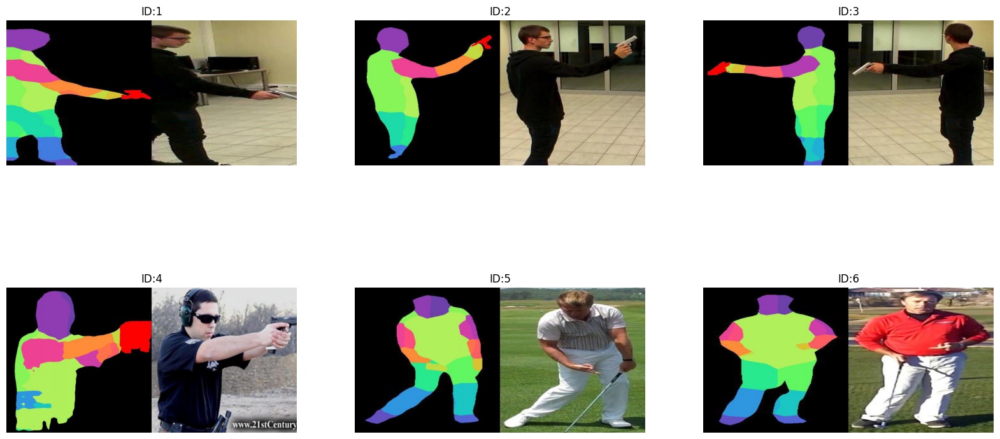

In [ ]:
imageEvaluatorUtil.graficarImagenes()

In [ ]:
#sample_image = tf.io.read_file(os.path.join(PATH,'test/9afb4c1b47f29d2bca4c4f74f70ef5f7_jpg.rf.76cf3aeccb64d2a98135d9ff21ba0ace.jpg'))
#sample_image = tf.io.decode_jpeg(sample_image)
#print(sample_image.shape)
#plt.figure()
#plt.imshow(sample_image)

Es necesario separar las imágenes de la persona real de las imágenes segmentadas, cuyo tamaño de 512x512 píxeles.

Se crea una función para la  carga de estas imagenes y que generan dos tensores uno por cada imagen:

In [ ]:
def load(image_file):
  # Read and decode an image file to a uint8 tensor
  image = tf.io.read_file(image_file)
  image = tf.io.decode_jpeg(image)

  # Split each image tensor into two tensors:
  # - one with a real building facade image
  # - one with an architecture label image 
  w = tf.shape(image)[1]
  w = w // 2
  # oRIGINAL
  input_image = image[:, w:, :]
  real_image = image[:, :w, :]
  #real_image = image[:, w:, :]
  #input_image = image[:, :w, :]

  # Convert both images to float32 tensors
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

Plot a sample of the input (architecture label image) and real (building facade photo) images:

['./data-set-person-armed-segmented-4/test/person\\000013469_jpg.rf.a207cbb65c23b58321ad6b242a0d4f55.jpg', './data-set-person-armed-segmented-4/test/person\\001539489_jpg.rf.4932d4e7d5de51c870be4500857dd15d.jpg', './data-set-person-armed-segmented-4/test/person\\001843421_jpg.rf.aa2690ffeac3dee5e8c9466710eb52b2.jpg', './data-set-person-armed-segmented-4/test/person\\004833214_jpg.rf.26ca21df601eee1336cdba185e9b56ce.jpg', './data-set-person-armed-segmented-4/test/person\\004836271_jpg.rf.5b7a249ebeb4037e270dfe7dd3889f3f.jpg', './data-set-person-armed-segmented-4/test/person\\005617608_jpg.rf.482cc8702f8c31660c697c8b12ec72c8.jpg', './data-set-person-armed-segmented-4/test/person\\005637550_jpg.rf.4b0b3b89047de8462ca2f7fb05d080dc.jpg', './data-set-person-armed-segmented-4/test/person\\006728461_jpg.rf.4221075aca7b8418ace3609071a60b8a.jpg', './data-set-person-armed-segmented-4/test/person\\007513778_jpg.rf.9a7248d692dbcce488293aa37939d83e.jpg', './data-set-person-armed-segmented-4/test/per

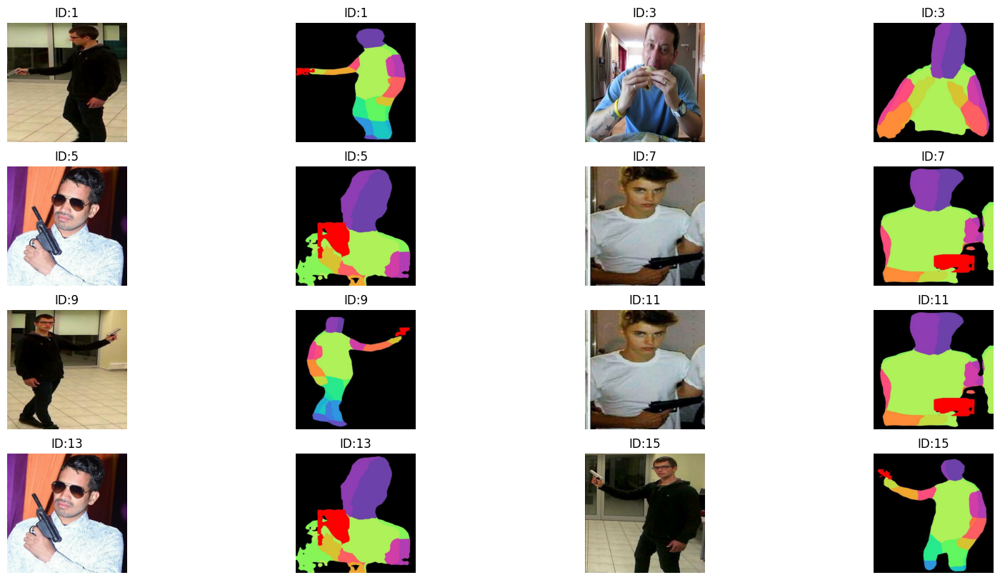

In [ ]:
imageEvaluatorUtil.graficarImagenesCarga(load)

In [ ]:

# Casting to int for matplotlib to display the images
#plt.figure()
#plt.imshow(inp / 255.0)
#plt.figure()
#plt.imshow(re / 255.0)

Se aplica rotaciones y reflejos aleatorios para preprocesar el conjunto de entrenamiento.

Defina varias funciones que:

1. Se cambiar el tamaño de cada imagen `512 x 512` a una mayor altura y anchura: `598 x 598`.
2. Se recorta aleatoriamente a `512 x 512`.
3. Se voltea aleatoriamente la imagen horizontalmente, es decir, de izquierda a derecha (espejo aleatorio).
4. Se Normaliza las imágenes al rango `[-1, 1]`.

In [ ]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

In [ ]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

In [ ]:
# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [ ]:
@tf.function()
def random_jitter(input_image, real_image):
  # Resizing to 286x286  
  input_image, real_image = resize(input_image, real_image, IMG_HEIGHT+86, IMG_WIDTH+86)

  # Random cropping back to 256x256
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

Resultado:

In [ ]:
inp, re = load(imageEvaluatorUtil.getPathTestImage())

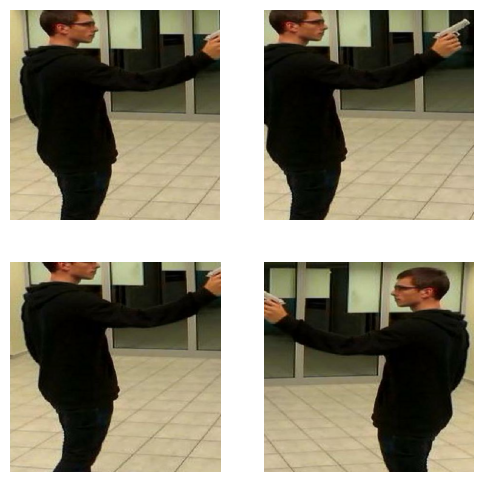

In [ ]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i + 1)
  plt.imshow(rj_inp / 255.0)
  plt.axis('off')
plt.show()

Se crean las funciones auxiliares para cargar y preprocesar los conjuntos de entrenamiento y prueba:

In [ ]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [ ]:
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

## Separación de los datos de entrenamiento y test

### Train data set

In [ ]:
train_dataset = tf.data.Dataset.list_files(os.path.join(PATH,'train/person/*.jpg'))
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

### Test data set

In [ ]:
try:
  test_dataset = tf.data.Dataset.list_files(os.path.join(PATH,'test/person/*.jpg'))
except tf.errors.InvalidArgumentError:
  test_dataset = tf.data.Dataset.list_files(os.path.join(PATH,'val/person/*.jpg'))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

## Generador


El generador de la red pix2pix cGAN es un U-Net modificado. Una U-Net consta de un codificador (disminución de muestreo) y un decodificador (disminución de muestreo).  En donde cada bloque del codificador esta formado por: Convolution -> Batch normalization -> Leaky ReLU. Cada bloque en el decodificador es: Transposed convolution -> Batch normalization -> Dropout (applied to the first 3 blocks) -> ReLU.

Existen conexiones de salto entre el codificador y el decodificador.


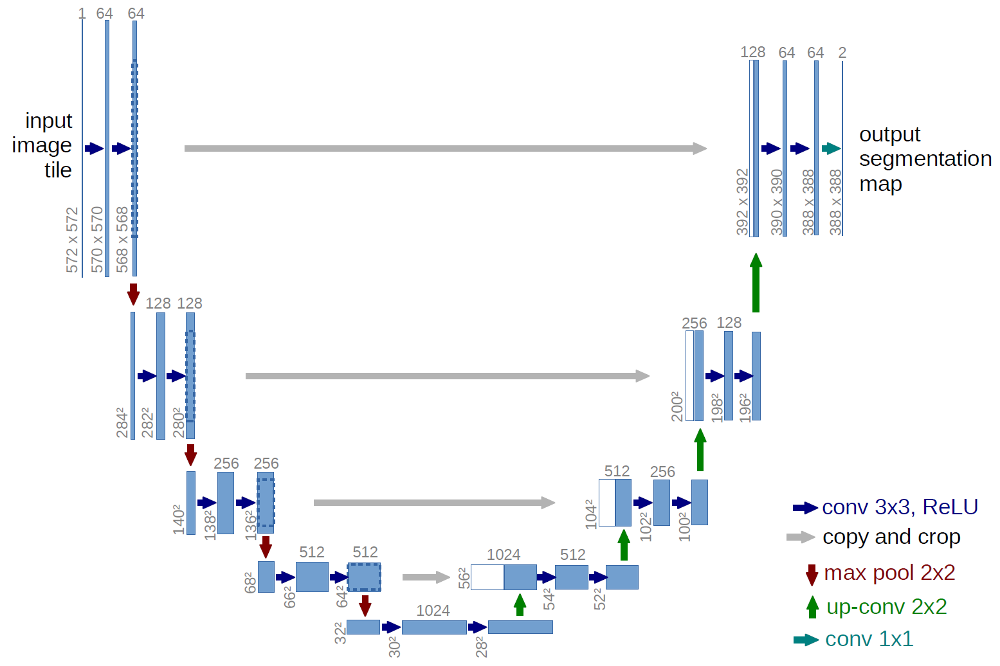

Definir el codificador(downsampler):

In [ ]:
OUTPUT_CHANNELS = 3

In [ ]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [ ]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

(1, 256, 256, 3)



Defina el decodificador(upsampler):

In [ ]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [ ]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 512, 512, 3)


Creamos la función generador con el downsampler y el upsampler:

In [ ]:
def Generator():  
  inputs = tf.keras.layers.Input(shape=[IMG_WIDTH, IMG_HEIGHT, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])  

  # Upsampling and establishing the skip connections
  k = 1
  for up, skip in zip(up_stack, skips):    
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])  
  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

## Arquitectura del generador

In [ ]:
!pip install pydot
!pip install graphviz

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.


Probamos en generador:

In [ ]:
inp

<tf.Tensor: shape=(512, 512, 3), dtype=float32, numpy=
array([[[133., 123.,  88.],
        [135., 121.,  76.],
        [133., 119.,  72.],
        ...,
        [ 45.,  46.,  15.],
        [ 45.,  46.,  15.],
        [ 45.,  46.,  15.]],

       [[137., 127.,  92.],
        [139., 125.,  80.],
        [137., 123.,  76.],
        ...,
        [ 46.,  47.,  16.],
        [ 46.,  47.,  16.],
        [ 46.,  47.,  16.]],

       [[143., 133.,  98.],
        [145., 131.,  86.],
        [142., 128.,  81.],
        ...,
        [ 46.,  47.,  16.],
        [ 46.,  47.,  16.],
        [ 46.,  47.,  16.]],

       ...,

       [[211., 199., 175.],
        [214., 199., 166.],
        [214., 199., 166.],
        ...,
        [203., 189., 160.],
        [203., 189., 160.],
        [203., 189., 160.]],

       [[214., 202., 178.],
        [217., 202., 169.],
        [217., 202., 169.],
        ...,
        [203., 189., 160.],
        [203., 189., 160.],
        [204., 190., 161.]],

       [[216., 20

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


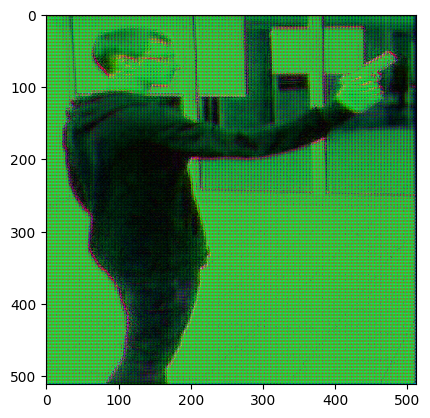

In [ ]:
gen_output = generator(inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

## Pérdida del generador
Las cGAN aprenden de una pérdida que penaliza una posible estructura que difiere de la salida de la red y la imagen de destino, como se describe en el artículo [Image-to-Image Translation with Conditional Adversarial Networks](https://arxiv.org/pdf/1611.07004.pdf).

- **gan_loss**, es la pérdida del generador es una pérdida de entropía cruzada sigmoidea de las imágenes generadas y una matriz de unos.
- **L1**, es una pérdida que mide el MAE (error absoluto medio) entre la imagen generada y la imagen de destino. Esto permite que la imagen generada se vuelva estructuralmente similar a la imagen de destino.

La fórmula para calcular la **pérdida total del generador** es la suma de la perida de la red GAN(gan_loss) + LAMBDA * l1_loss, donde LAMBDA = 100.

In [ ]:
LAMBDA = 100

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

## Procedimiento de entrenamiento para el generador

![Generator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/gen.png?raw=1)


## Discriminador

PatchGAN es un tipo de discriminador para redes antagónicas generativas que solo penaliza la estructura a escala de parches de imagen locales. El discriminador PatchGAN intenta clasificar si cada parche en una imagen es real o falso. Este discriminador se ejecuta de forma convolucional a través de la imagen, promediando todas las respuestas para proporcionar el resultado final. Dicho discriminador modela efectivamente la imagen como un campo aleatorio de Markov, suponiendo independencia entre píxeles separados por más de un diámetro de parche. Puede entenderse como un tipo de pérdida de textura/estilo.

El discriminador es un clasificador PatchGAN convolucional que intenta clasificar si cada imagen _parche_ es real o no, como se describe en el artículo de pix2pix.

- Cada bloque en el discriminador es: Convolution -> Batch normalization -> Leaky ReLU.
- La forma de la salida después de la última capa es `(batch_size, 30, 30, 1)`.
- Cada parche de imagen `30 x 30` de la salida clasifica una porción `70 x 70` de la imagen de entrada.
- El discriminador recibe 2 entradas:
    - La imagen de entrada y la imagen de destino, que debe clasificar como *real*.
    - La imagen de entrada y la imagen generada (la salida del generador), que debe clasificar como *false*.
    - Utiliza `tf.concatenate([inp, tar], axis=-1)` para concatenar estas 2 entradas juntas.

In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[IMG_WIDTH, IMG_HEIGHT, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[IMG_WIDTH, IMG_HEIGHT, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

## Arquitectura del discriminador

In [ ]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.


Validamos el discriminador:

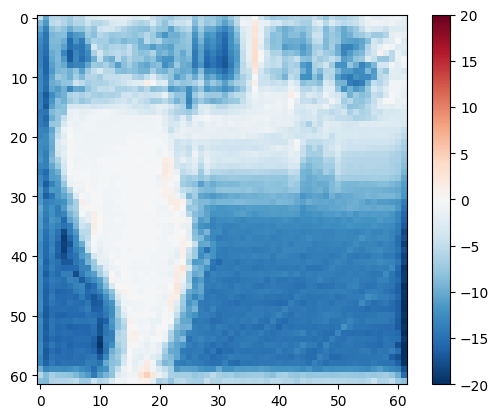

In [ ]:
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

## Pérdida del discriminador
La función discriminator_loss tiene 2 entradas: las imágenes reales y las imágenes generadas.
- **real_loss** es una pérdida de entropía cruzada sigmoidea de las imágenes reales y una matriz de unos (ya que estas son las imágenes reales).
- **generated_loss** es una pérdida de entropía cruzada sigmoidea de las imágenes generadas y una matriz de ceros (ya que estas son las imágenes falsas).

La **pérdida_total** es la suma de la pérdida_real y la pérdida_generada.

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

## Procedimiento de entrenamiento para el discriminador

![Discriminator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/dis.png?raw=1)


## Definir los optimizadores y un punto de control(checkpoint)


In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## Generar imágenes durante entrenamiento

Perimte graficas las imágenes durante el entrenamiento.

- Pasar imágenes de prueba al generador.
- El generador luego traducirá la imagen de entrada a la salida.
- El último paso realizar las predicciones.

In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

Ejemplo ejecución función de generación:

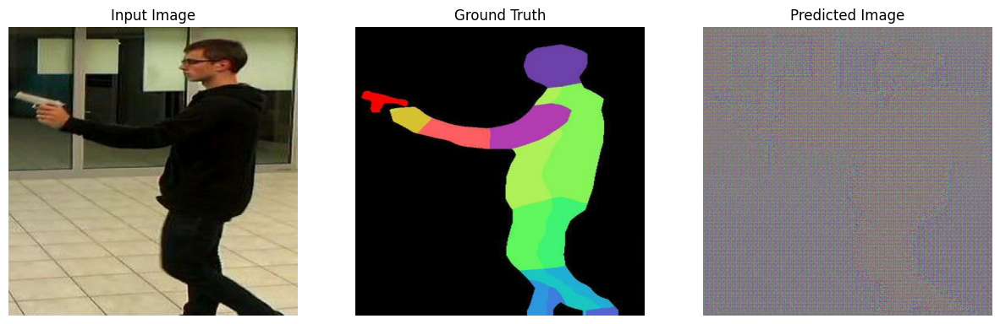

In [ ]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

## Entrenamiento


El proceso es el siguiente:
- Para cada imagen  de entrada genera una imagen de salida.
- El discriminador recibe la `imagen_de_entrada` y la imagen generada como primera entrada. La segunda entrada es `input_image` y `target_image`.
- Calcular el generador y la pérdida del discriminador.
- Calcular las pérdidas con respecto tanto al generador y al discriminador(entradas) y se deben aplicar al optimizador.

In [ ]:
log_dir="./logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

## Visualización entrenamiento
* 1k pasos: borre la pantalla y ejecuta generate_images para mostrar el progreso.
* 5k pasos: guarda un punto de control.

In [ ]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

Luego del entrenamiento guarda registros que se pueden ver en TensorBoard para monitorear el progreso del entrenamiento.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 55416), started 4:53:27 ago. (Use '!kill 55416' to kill it.)

Finally, run the training loop:

Time taken for 1000 steps: 162.93 sec



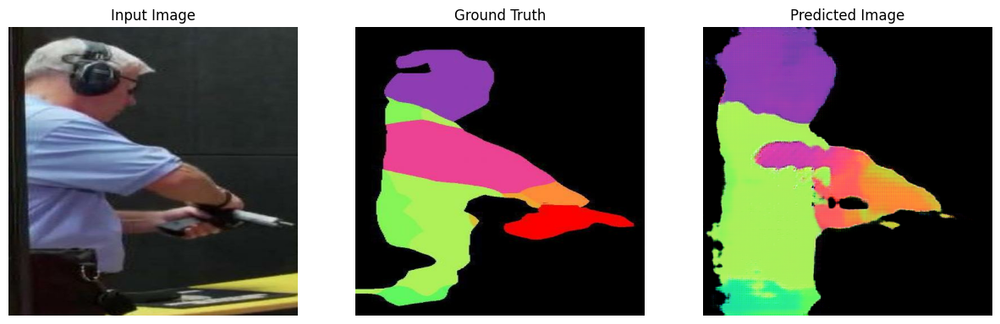

Step: 39k
....................................................................................................

In [ ]:
#fit(train_dataset, test_dataset, steps=40000)
fit(train_dataset, test_dataset, steps=40000)

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 55416), started 2:41:03 ago. (Use '!kill 55416' to kill it.)

Interpreting the logs is more subtle when training a GAN (or a cGAN like pix2pix) compared to a simple classification or regression model. Things to look for:

- Check that neither the generator nor the discriminator model has "won". If either the `gen_gan_loss` or the `disc_loss` gets very low, it's an indicator that this model is dominating the other, and you are not successfully training the combined model.
- The value `log(2) = 0.69` is a good reference point for these losses, as it indicates a perplexity of 2 - the discriminator is, on average, equally uncertain about the two options.
- For the `disc_loss`, a value below `0.69` means the discriminator is doing better than random on the combined set of real and generated images.
- For the `gen_gan_loss`, a value below `0.69` means the generator is doing better than random at fooling the discriminator.
- As training progresses, the `gen_l1_loss` should go down.

## Predicciones 
Para esto se toma el último punto de control.

In [ ]:
!ls {checkpoint_dir}

checkpoint
ckpt-1.data-00000-of-00001
ckpt-1.index
ckpt-2.data-00000-of-00001
ckpt-2.index
ckpt-3.data-00000-of-00001
ckpt-3.index
ckpt-4.data-00000-of-00001
ckpt-4.index
ckpt-5.data-00000-of-00001
ckpt-5.index
ckpt-6.data-00000-of-00001
ckpt-6.index
ckpt-7.data-00000-of-00001
ckpt-7.index
ckpt-8.data-00000-of-00001
ckpt-8.index


In [ ]:
tf.train.latest_checkpoint(checkpoint_dir)

'./training_checkpoints\\ckpt-8'

In [ ]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

## Mostrar predicciones

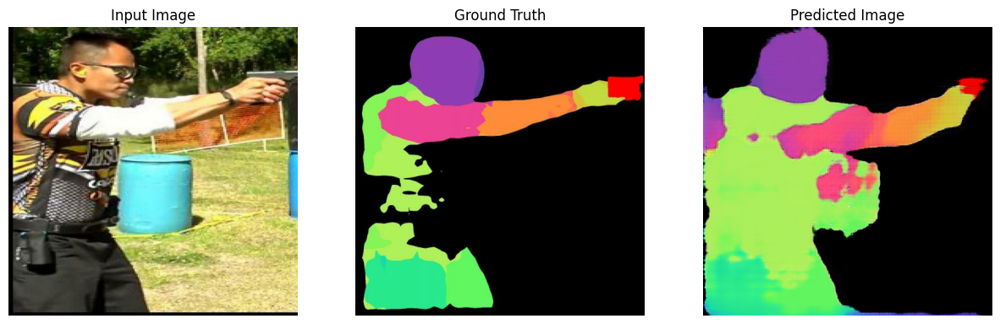

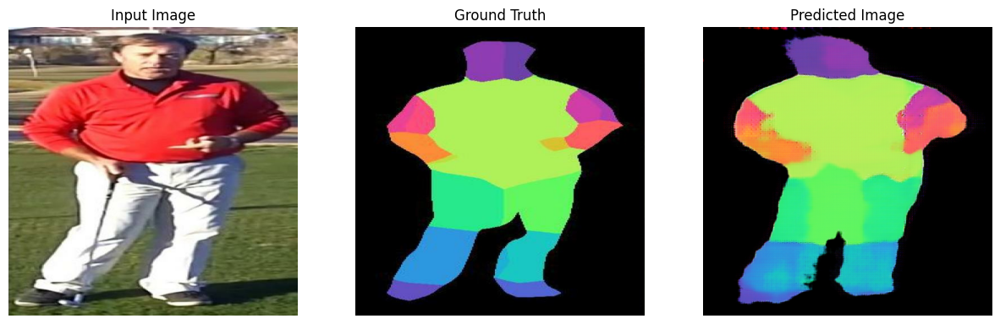

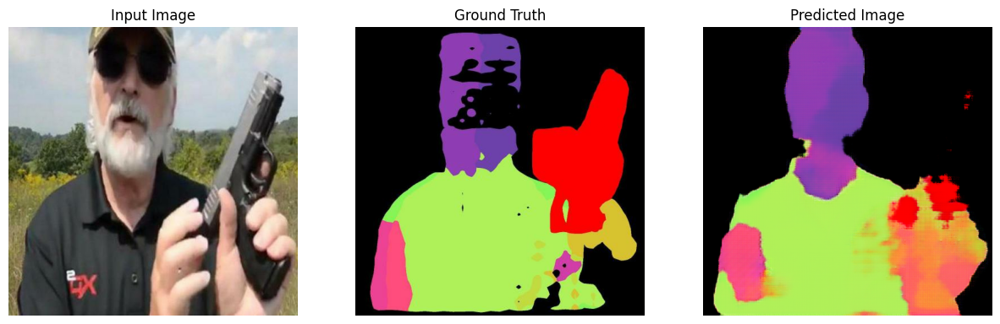

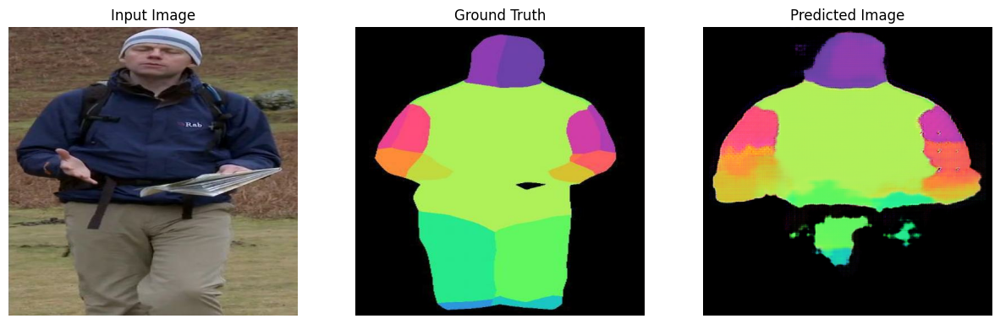

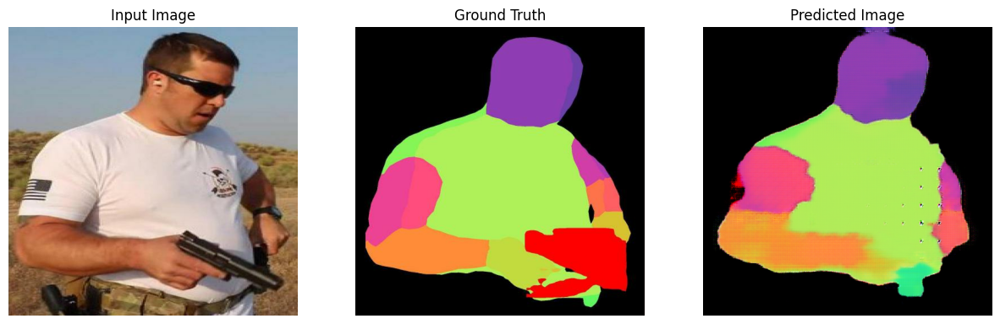

...

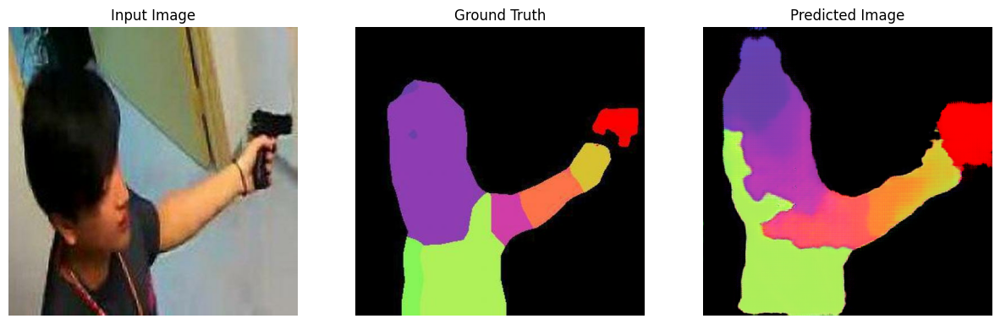

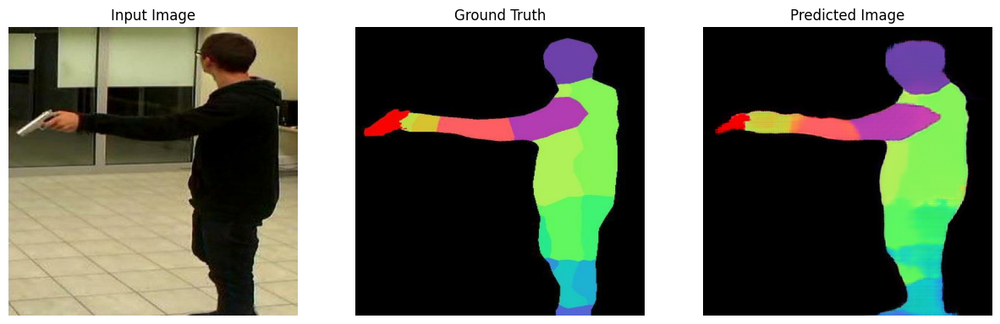

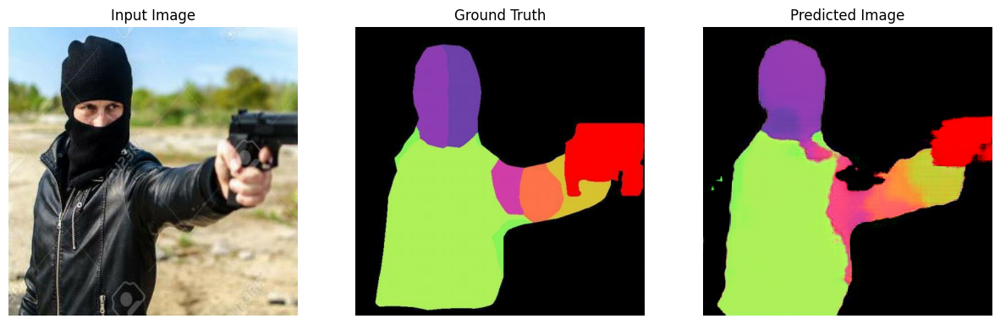

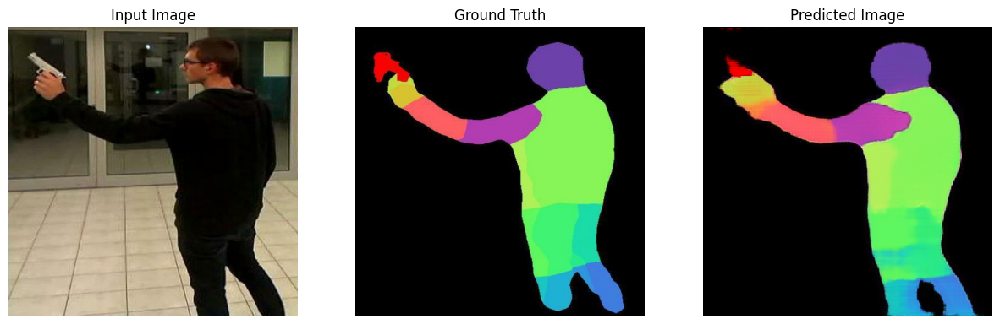

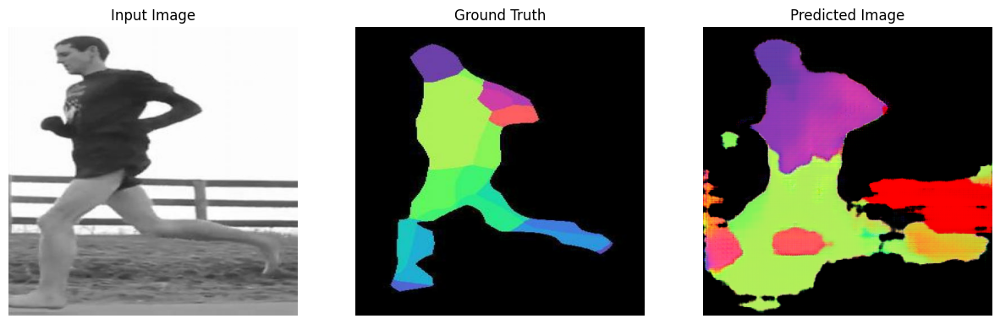

In [ ]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(20):
  generate_images(generator, inp, tar)

In [ ]:
def generate_images_predict(model, test_input):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

def load_predict(image_file):
  # Read and decode an image file to a uint8 tensor
  image = cv2.imread(image_file)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  image = cv2.resize(image, (IMG_WIDTH, IMG_HEIGHT))

  #image_resized = tf.reshape(image, [-1, IMG_WIDTH, IMG_HEIGHT, 3, 1])
  #image_resized = tf.squeeze(image_resized)
  #resize_image = tf.image.resize(image, [IMG_WIDTH, IMG_HEIGHT])
  
  # Split each image tensor into two tensors:
  # - one with a real building facade image
  # - one with an architecture label image 
  w = tf.shape(image)[1]
  w = w // 2
  # oRIGINAL
  input_image = image
  real_image = image
  #real_image = image[:, w:, :]
  #input_image = image[:, :w, :]

  # Convert both images to float32 tensors
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

def load_image_predict(image_file):
  input_image, real_image = load_predict(image_file)
  #input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

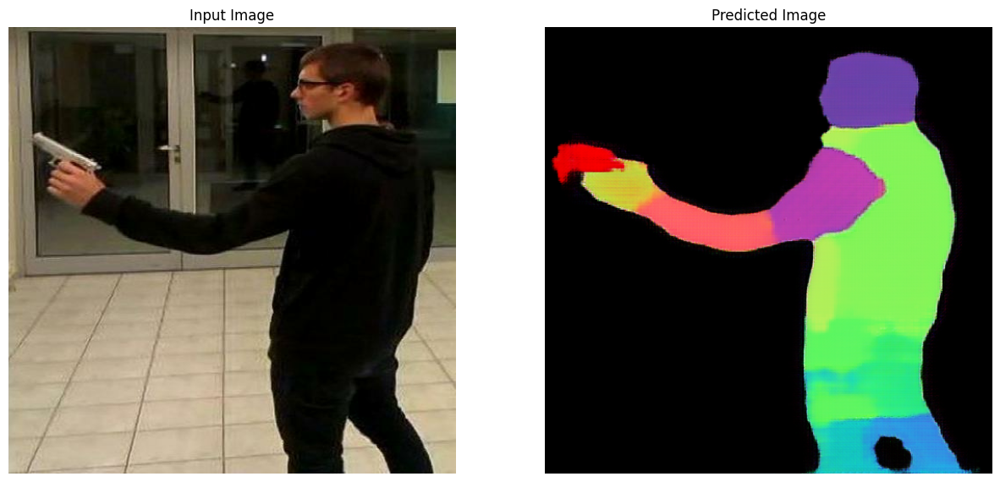

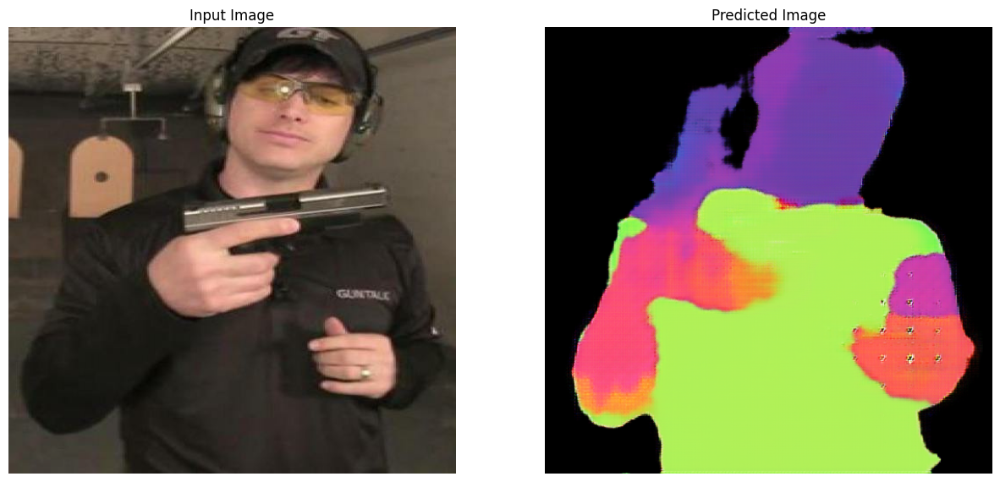

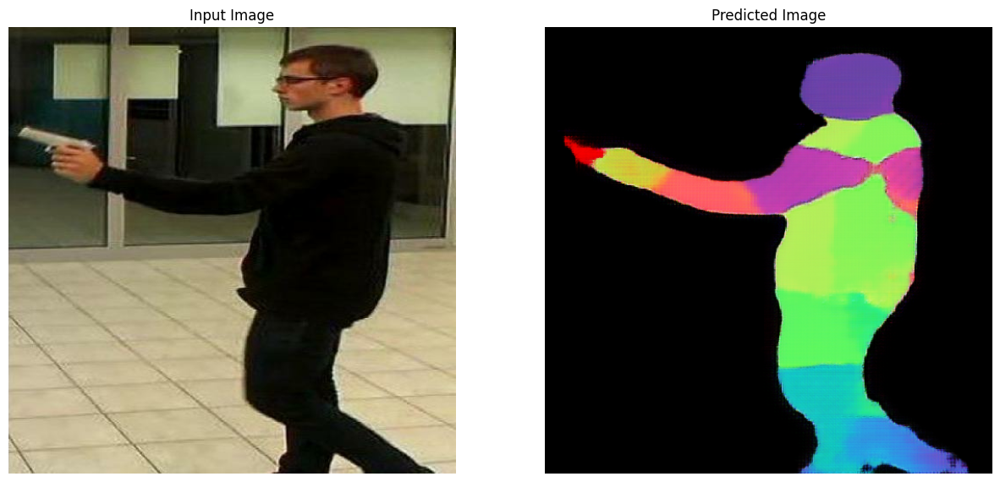

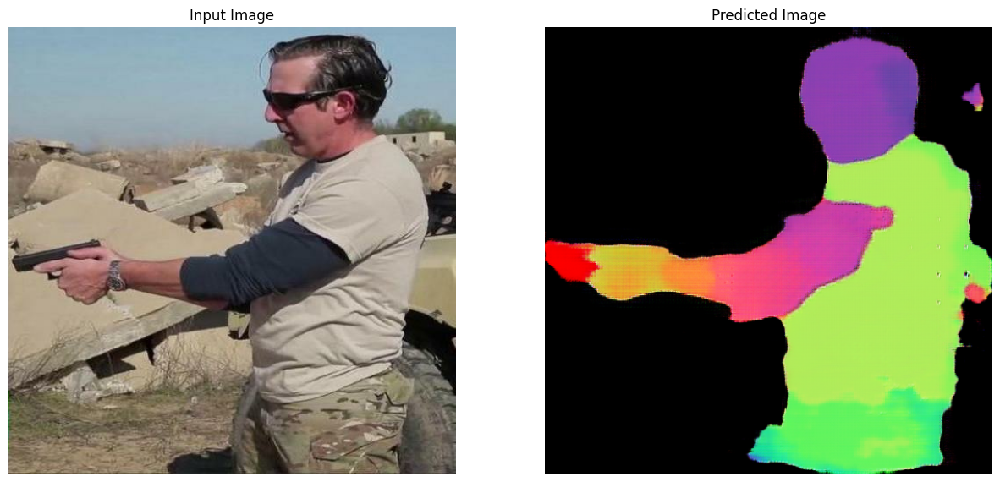

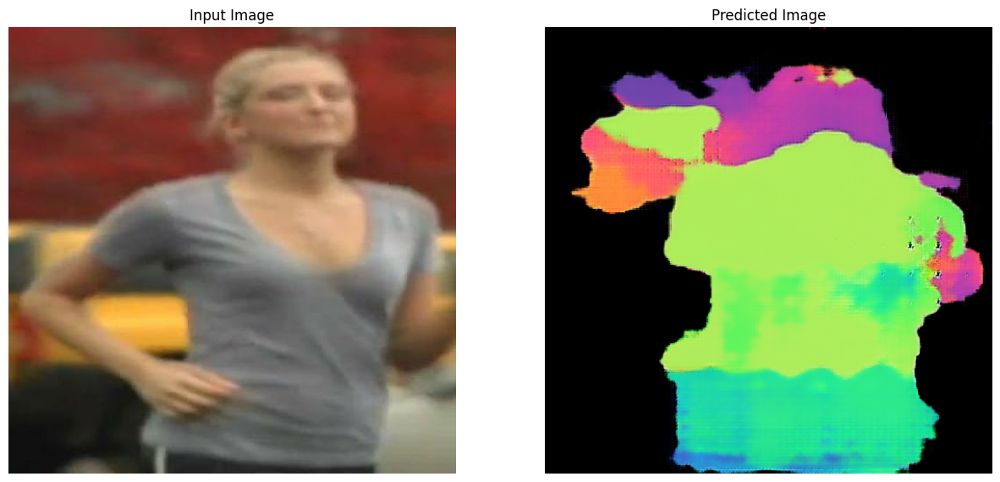

In [ ]:
for inp, tar in test_dataset.take(5):
  generate_images_predict(generator, inp)

In [ ]:
inptest, re = load_image_predict("./WIN_20230109_01_23_59_Pro.jpg")
inptest

<tf.Tensor: shape=(512, 512, 3), dtype=float32, numpy=
array([[[-0.6784314 , -0.8117647 , -0.7254902 ],
        [-0.6784314 , -0.8117647 , -0.7647059 ],
        [-0.67058825, -0.7882353 , -0.7882353 ],
        ...,
        [-0.8039216 , -0.78039217, -0.8352941 ],
        [-0.81960785, -0.78039217, -0.85882354],
        [-0.827451  , -0.78039217, -0.85882354]],

       [[-0.6784314 , -0.8039216 , -0.73333335],
        [-0.6862745 , -0.8039216 , -0.7647059 ],
        [-0.67058825, -0.7882353 , -0.7882353 ],
        ...,
        [-0.8117647 , -0.7882353 , -0.84313726],
        [-0.81960785, -0.78039217, -0.8509804 ],
        [-0.827451  , -0.78039217, -0.85882354]],

       [[-0.67058825, -0.7882353 , -0.7411765 ],
        [-0.67058825, -0.78039217, -0.7647059 ],
        [-0.6627451 , -0.77254903, -0.79607844],
        ...,
        [-0.79607844, -0.77254903, -0.827451  ],
        [-0.81960785, -0.77254903, -0.84313726],
        [-0.81960785, -0.77254903, -0.8509804 ]],

       ...,

     

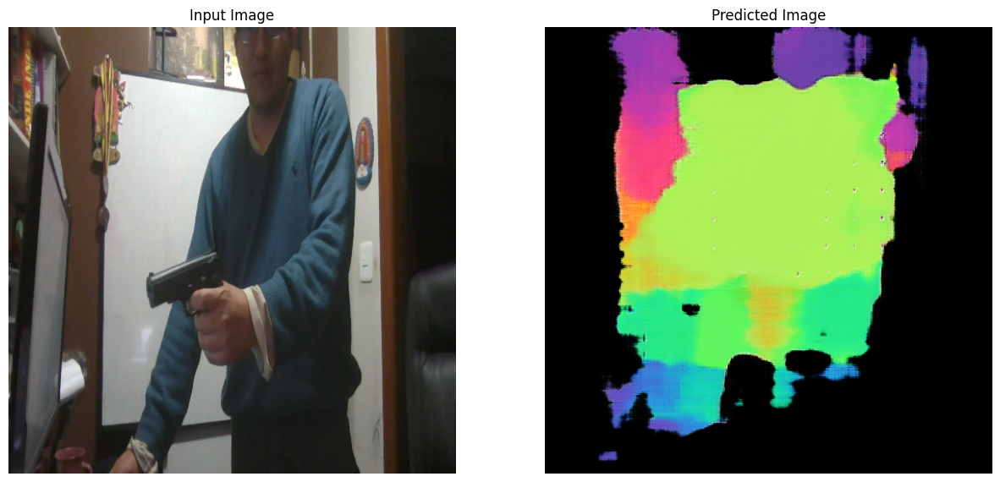

In [ ]:
generate_images_predict(generator, inptest[tf.newaxis, ...])